In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt 
%matplotlib inline
from IPython.display import Image
plt.rcParams['image.cmap'] = 'gray'

# Read and display original image

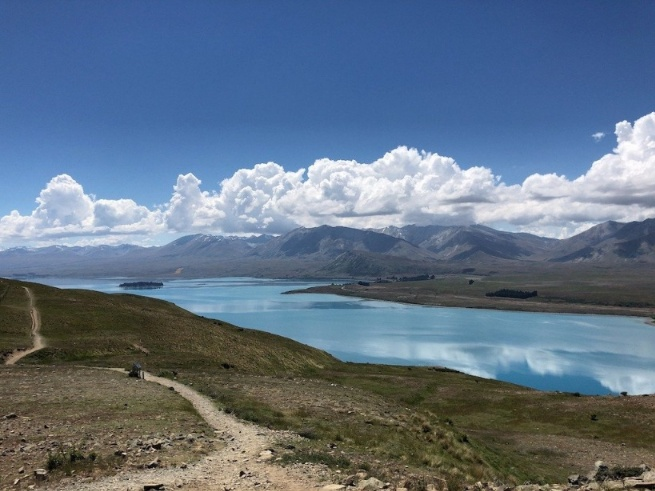

In [3]:
image = 'new-zealand-lake.jpg'
img = cv2.imread(image, cv2.IMREAD_COLOR)

Image(filename = image, width = '400')

# Addition/Subtraction: Changes the Image Brightness

Text(0.5, 1.0, 'Brighter')

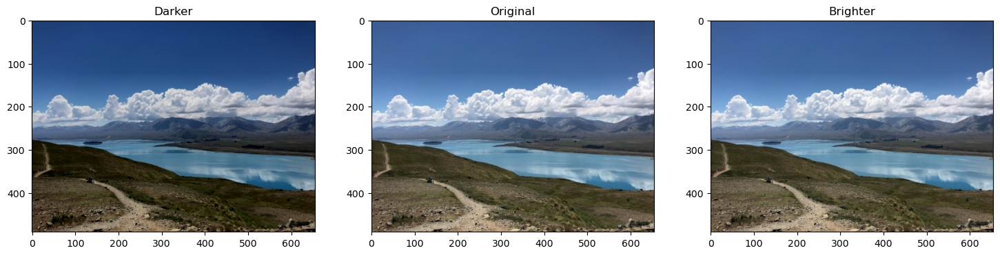

In [5]:
matrix = np.ones(img.shape, dtype = 'uint8') * 30
img_brighter = cv2.add(img, matrix)
img_darker = cv2.subtract(img, matrix)

plt.figure(figsize = [18, 5])
plt.subplot(131); plt.imshow(img_darker[:, :, ::-1]); plt.title('Darker')
plt.subplot(132); plt.imshow(img[:, :, ::-1]); plt.title('Original')
plt.subplot(133); plt.imshow(img[:, :, ::-1]); plt.title('Brighter')

# Multiplication: Changes the Image Contrast

Text(0.5, 1.0, 'Lower Contrast')

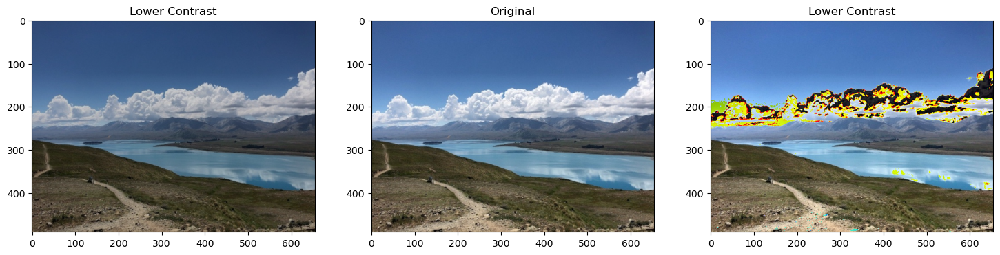

In [8]:
matrix1 = np.ones(img.shape)*0.8
matrix2 = np.ones(img.shape)*1.2
img_lower = np.uint8(cv2.multiply(np.float64(img), matrix1))
img_higher = np.uint8(cv2.multiply(np.float64(img), matrix2))

plt.figure(figsize = [18,5])
plt.subplot(131); plt.imshow(img_lower[:,:,::-1]); plt.title('Lower Contrast')
plt.subplot(132); plt.imshow(img[:,:,::-1]); plt.title('Original')
plt.subplot(133); plt.imshow(img_higher[:,:,::-1]); plt.title('Lower Contrast')

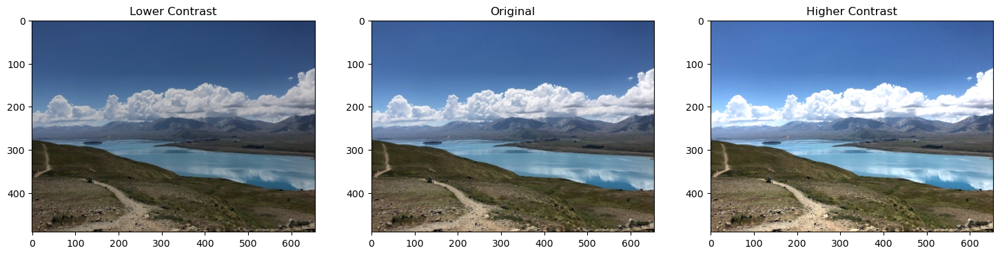

In [10]:

matrix_ones = np.ones(img.shape, dtype = 'float64')


img_lower   = np.uint8(cv2.multiply(np.float64(img), matrix_ones, scale = 0.8))
img_higher  = np.uint8(np.clip(cv2.multiply(np.float64(img), matrix_ones, scale = 1.2) , 0, 255))

# Display the images.
plt.figure(figsize = [18,5])
plt.subplot(131); plt.imshow(img_lower[:, :, ::-1]);  plt.title('Lower Contrast')
plt.subplot(132); plt.imshow(img[:, :, ::-1]);        plt.title('Original')
plt.subplot(133); plt.imshow(img_higher[:, :, ::-1]); plt.title('Higher Contrast');

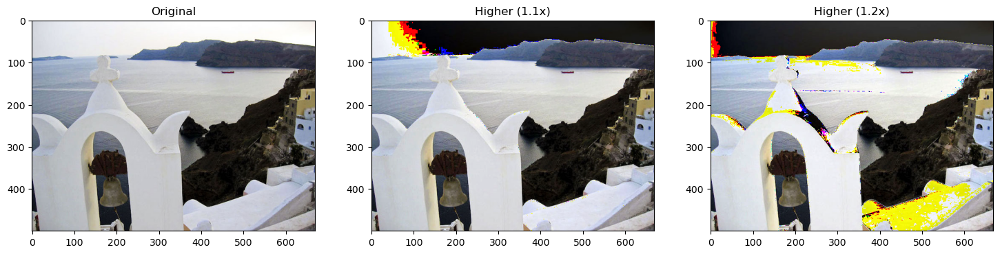

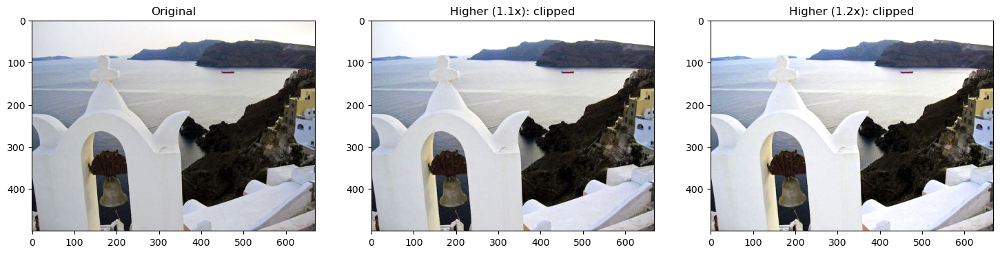

In [17]:

image = 'Santorini.jpg'
img = cv2.imread(image, cv2.IMREAD_COLOR)


matrix_ones = np.ones(img.shape, dtype = 'float64') 


img_higher1  = np.uint8(cv2.multiply(np.float64(img), matrix_ones, scale = 1.1))
img_higher2  = np.uint8(cv2.multiply(np.float64(img), matrix_ones, scale = 1.2))

plt.figure(figsize=[18,5])
plt.subplot(131); plt.imshow(img[:, :, ::-1]);         plt.title('Original')
plt.subplot(132); plt.imshow(img_higher1[:, :, ::-1]); plt.title('Higher (1.1x)')
plt.subplot(133); plt.imshow(img_higher2[:, :, ::-1]); plt.title('Higher (1.2x)');


img_higher1  = np.uint8(np.clip(cv2.multiply(np.float64(img), matrix_ones, scale = 1.1),0,255))
img_higher2  = np.uint8(np.clip(cv2.multiply(np.float64(img), matrix_ones, scale = 1.2),0,255))


plt.figure(figsize = [18,5])
plt.subplot(131); plt.imshow(img[:, :, ::-1]);         plt.title('Original')
plt.subplot(132); plt.imshow(img_higher1[:, :, ::-1]); plt.title('Higher (1.1x): clipped')
plt.subplot(133); plt.imshow(img_higher2[:, :, ::-1]); plt.title('Higher (1.2x): clipped');

# Thresholding

165.0


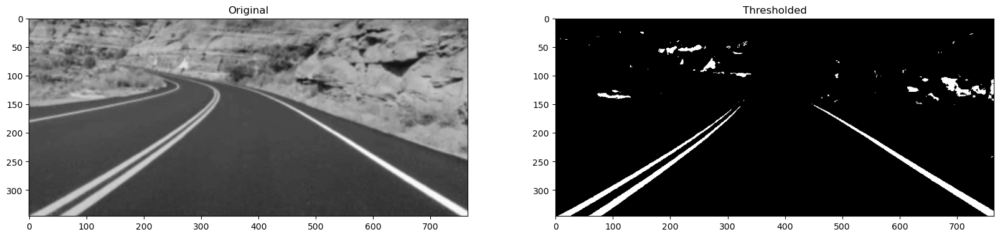

In [21]:
img = cv2.imread('road_lanes.png', cv2.IMREAD_GRAYSCALE)
retval, img_thresh = cv2.threshold(img, 165, 255, cv2.THRESH_BINARY)
plt.figure(figsize = [20, 8])
plt.subplot(121); plt.imshow(img); plt.title('Original')
plt.subplot(122); plt.imshow(img_thresh); plt.title('Thresholded');

# Adaptive thresholding
we used one global value as a threshold. But this might not be good in all cases, e.g. if an image has different lighting conditions in different areas. In that case, adaptive thresholding can help. Here, the algorithm determines the threshold for a pixel based on a small region around it. So we get different thresholds for different regions of the same image which gives better results for images with varying illumination.

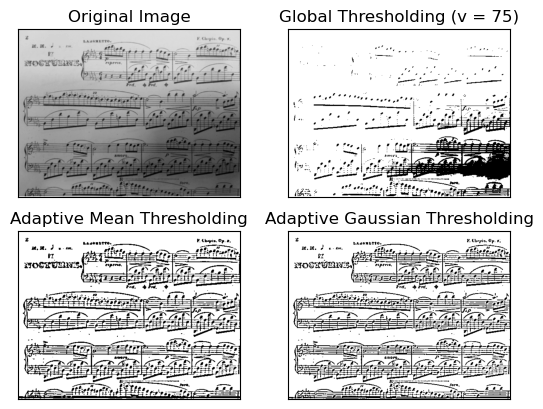

In [24]:
img = cv2.imread('Piano_Sheet_Music.png', cv2.IMREAD_GRAYSCALE)
retval, img_thresh_gbl_1 = cv2.threshold(img, 75, 255, cv2.THRESH_BINARY)
img_thresh_adp_mean = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 13, 7)
img_thresh_adp_guassian = cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,13,7)

titles = ['Original Image', 'Global Thresholding (v = 75)',
            'Adaptive Mean Thresholding', 'Adaptive Gaussian Thresholding']
images = [img, img_thresh_gbl_1, img_thresh_adp_mean, img_thresh_adp_guassian]
for i in range(4):
    plt.subplot(2,2,i+1),plt.imshow(images[i],'gray')
    plt.title(titles[i])
    plt.xticks([]),plt.yticks([])
plt.show()

# Logical Operations

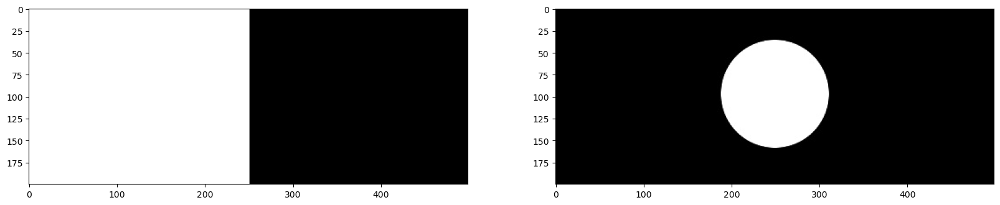

In [25]:
img_rec = cv2.imread('rectangle.jpg', cv2.IMREAD_GRAYSCALE)
img_cir = cv2.imread('circle.jpg', cv2.IMREAD_GRAYSCALE)

plt.figure(figsize = [20,5])
plt.subplot(121);  plt.imshow(img_rec);
plt.subplot(122);  plt.imshow(img_cir);

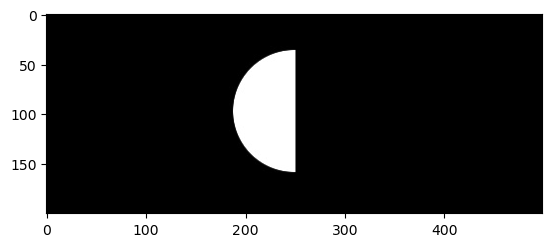

In [27]:
result = cv2.bitwise_and(img_rec, img_cir, mask = None)
plt.imshow(result);

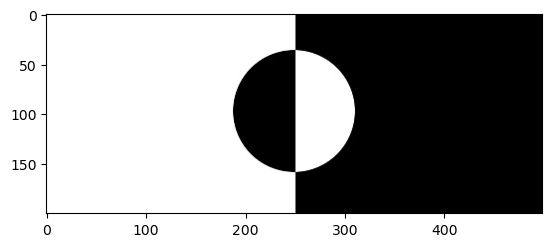

In [28]:
result = cv2.bitwise_xor(img_rec, img_cir, mask = None)
plt.imshow(result);

(500, 500, 3)


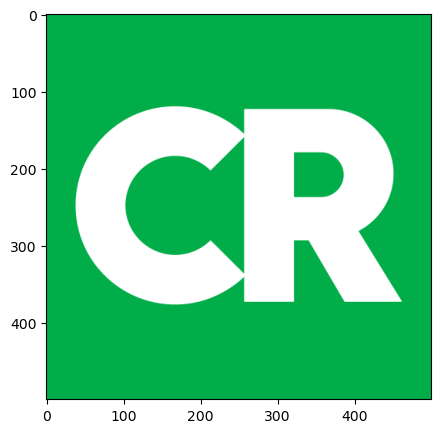

In [29]:
img_logo = cv2.imread('CR_Logo.png', cv2.IMREAD_COLOR)
print(img_logo.shape)
logo_h = img_logo.shape[0]
logo_w = img_logo.shape[1]
plt.figure(figsize = [5, 5])
plt.imshow(img_logo[:, :, ::-1]);

In [30]:
img_background = cv2.imread('checkerboard_color.png', cv2.IMREAD_COLOR)
print(img_background.shape);

(900, 900, 3)


# Read PNG image and split channels

(2436, 2623, 4)


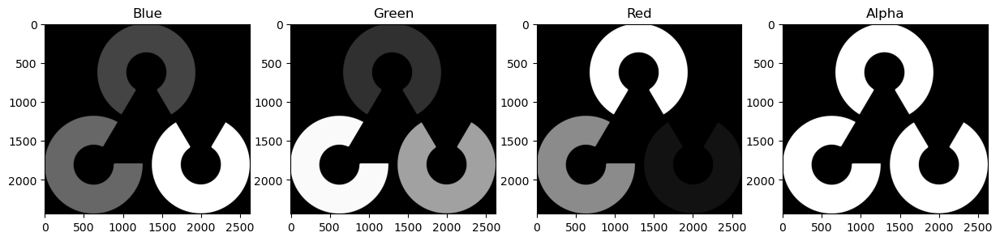

In [4]:
img = cv2.imread('opencv_logo.png', cv2.IMREAD_UNCHANGED)
print(img.shape)
b, g, r, a = cv2.split(img)
plt.figure(figsize = (15, 15))
plt.subplot(141); plt.imshow(b); plt.title('Blue')
plt.subplot(142); plt.imshow(g); plt.title('Green')
plt.subplot(143); plt.imshow(r); plt.title('Red')
plt.subplot(144); plt.imshow(a); plt.title('Alpha');



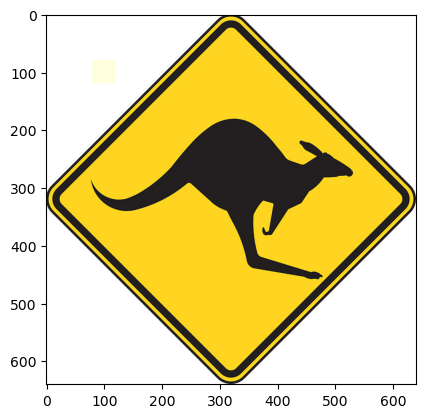

In [5]:
img_kang_org = cv2.imread('kangaroo.jpg', cv2.IMREAD_COLOR)
img_kang = cv2.imread('kangaroo_sign_with_green_marker.jpg', cv2.IMREAD_COLOR)
img_kang_org[80:120, 80:120, 0] = 220
img_kang_org[80:120, 80:120, 0] = 255
img_kang_org[80:120, 80:120, 0] = 220
plt.imshow(img_kang_org[:, :, ::-1])

# Watermarks

Image size:  (730, 1094, 3)
Logo size:  (2436, 2623, 4)
Logo size:  (244, 262, 4)


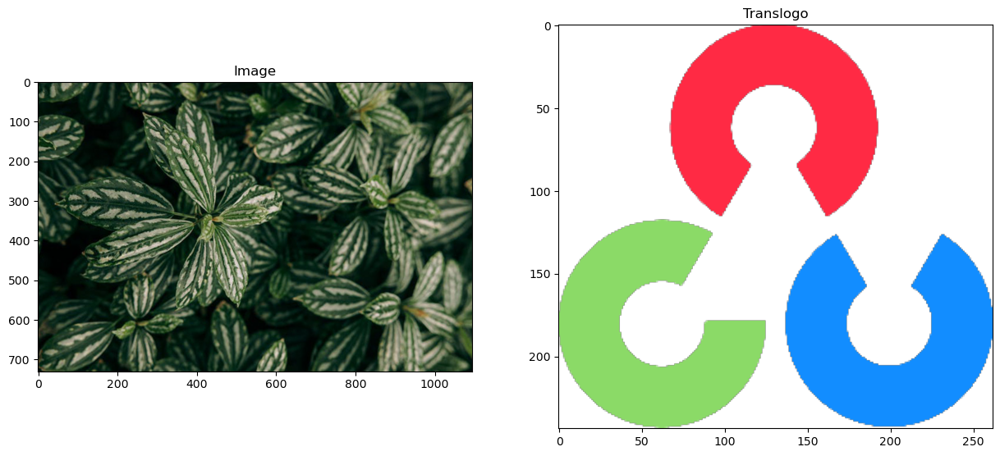

In [3]:
img = cv2.imread('leaves.jpg', cv2.IMREAD_UNCHANGED)
logo = cv2.imread('opencv_logo.png',cv2.IMREAD_UNCHANGED)
print('Image size: ', img.shape)
print('Logo size: ', logo.shape)
logo = cv2.resize(logo, None, fx = 0.1, fy = 0.1, interpolation = cv2.INTER_LINEAR)
logo_rgba = cv2.cvtColor(logo, cv2.COLOR_BGRA2RGBA)

plt.figure(figsize = (15, 10))
plt.subplot(121), plt.imshow(img[:, :, ::-1]); plt.title('Image')
plt.subplot(122), plt.imshow(logo_rgba); plt.title('Translogo');
print('Logo size: ', logo_rgba.shape)


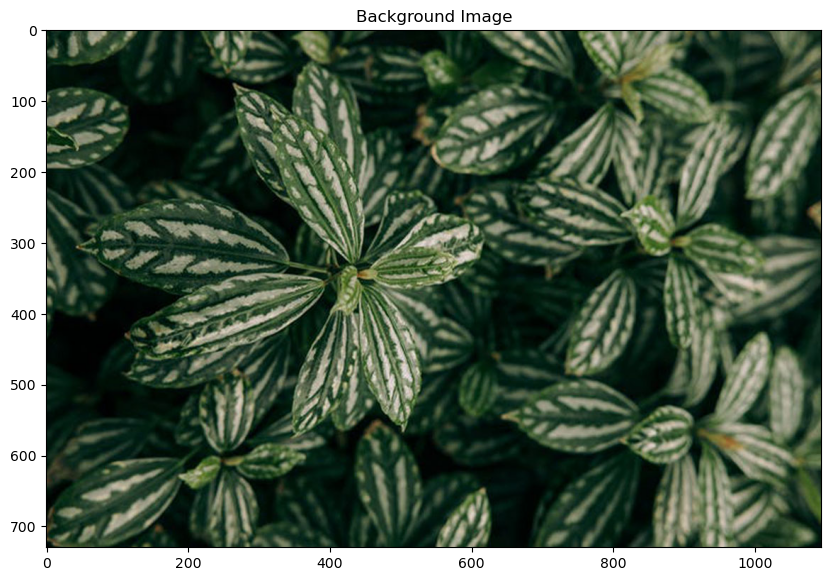

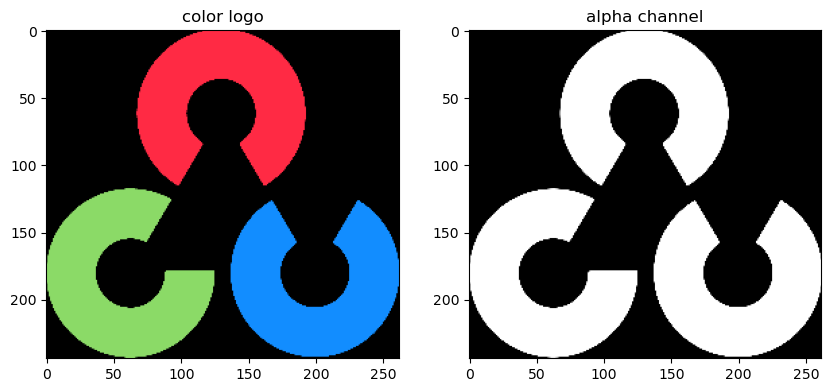

In [4]:
logo_rgb =logo_rgba[:, :, 0:3]
logo_alpha = logo_rgba[:, :, 3]
plt.figure(figsize = (10, 10))
plt.imshow(img[:, :,::-1]); plt.title('Background Image')
plt.figure(figsize = (10, 5))
plt.subplot(121); plt.imshow(logo_rgb); plt.title('color logo')
plt.subplot(122); plt.imshow(logo_alpha); plt.title('alpha channel');
img_h, img_w, _ = img.shape
logo_h, logo_w, _ = logo.shape

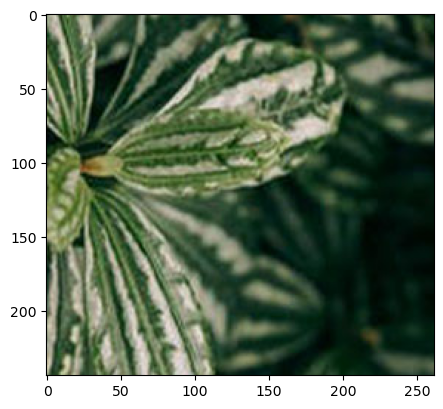

In [5]:
cx = int(img_w/2)
cy = int(img_h/2)
x1 = int(cx - logo_w/2)
y1 = int(cy - logo_h/2)
x2 = int(cx + logo_w/2)
y2 = int(cy + logo_h/2)
roi = img[y1:y2, x1:x2]
plt.figure(figsize = (5,5))
plt.imshow(roi[:,:,::-1])

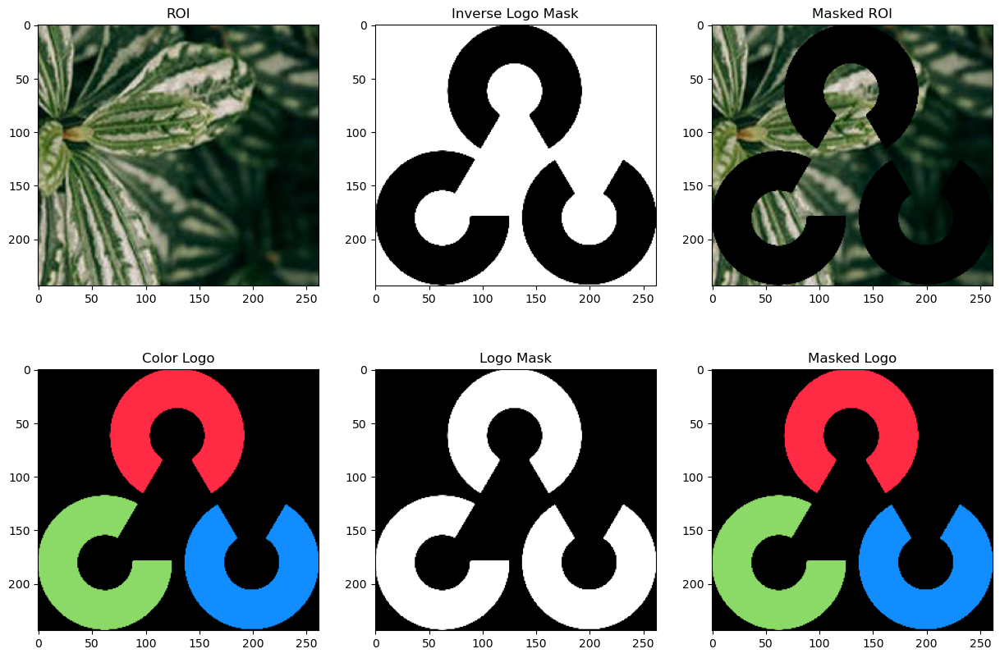

In [8]:
logo_mask = cv2.merge([logo_alpha, logo_alpha, logo_alpha])
logo_mask_inv = cv2.bitwise_not(logo_mask)
masked_roi = cv2.bitwise_and(roi, logo_mask_inv)
masked_logo = cv2.bitwise_and(logo_rgb, logo_mask)
plt.figure(figsize = [15, 10])

plt.subplot(231); plt.imshow(roi[:, :, ::-1]);           plt.title("ROI");
plt.subplot(232); plt.imshow(logo_mask_inv[:, :, ::-1]); plt.title("Inverse Logo Mask");
plt.subplot(233); plt.imshow(masked_roi[:, :, ::-1]);    plt.title("Masked ROI");

plt.subplot(234); plt.imshow(logo_rgb);      plt.title("Color Logo");
plt.subplot(235); plt.imshow(logo_mask[:, :, ::-1]);     plt.title("Logo Mask");
plt.subplot(236); plt.imshow(masked_logo);   plt.title("Masked Logo");

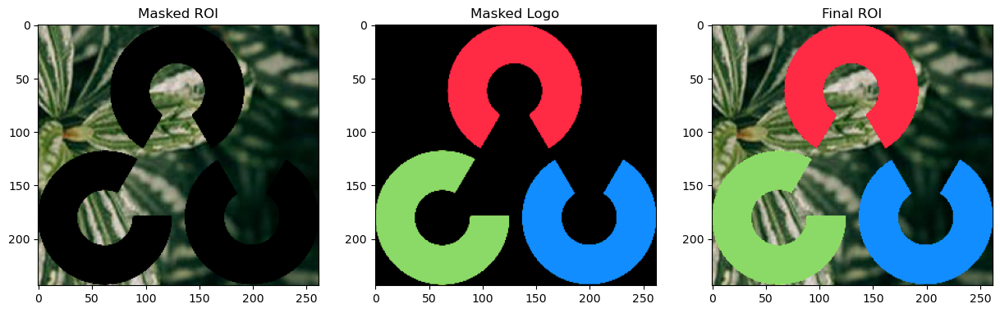

In [22]:
roi_final = cv2.bitwise_or(masked_roi[:,:,::-1], masked_logo)
plt.figure(figsize = [15, 10])

plt.subplot(131); plt.imshow(masked_roi[:,:,::-1]);  plt.title("Masked ROI");
plt.subplot(132); plt.imshow(masked_logo); plt.title("Masked Logo");
plt.subplot(133); plt.imshow(roi_final);   plt.title("Final ROI");

In [23]:
roi_1 = roi.copy()
img_1 = img[:,:,::-1]

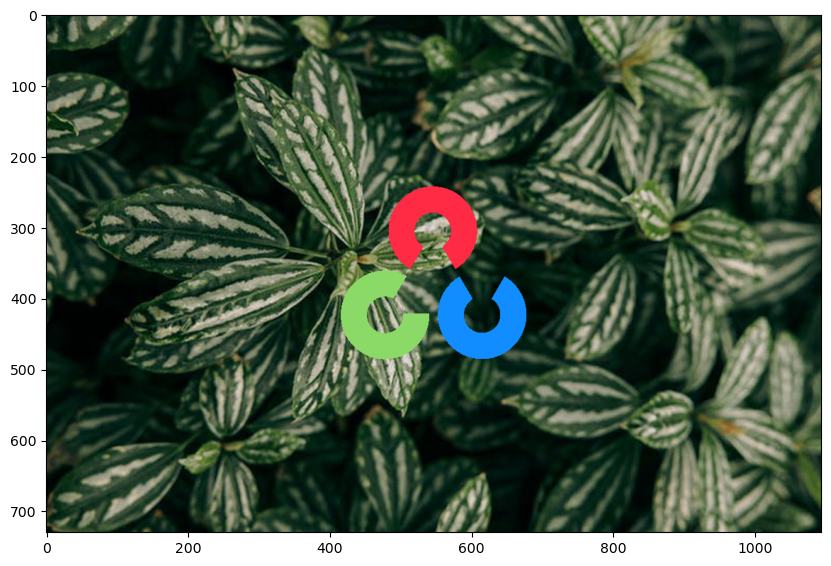

In [24]:
img_1[y1:y2, x1:x2] = roi_final
plt.figure(figsize = (10,10))
plt.imshow(img_1);

# E-signature

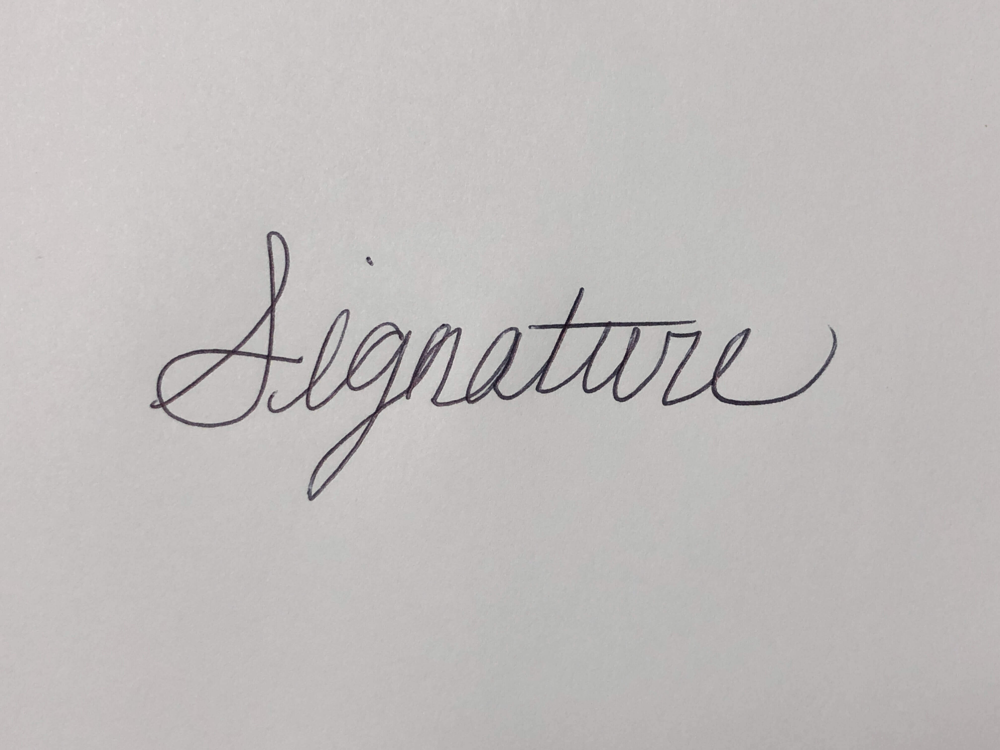

In [51]:
sig_org = cv2.imread('signature.jpg', cv2.IMREAD_COLOR)

# Display the actual image in the browser.
Image('signature.jpg', width = '400')

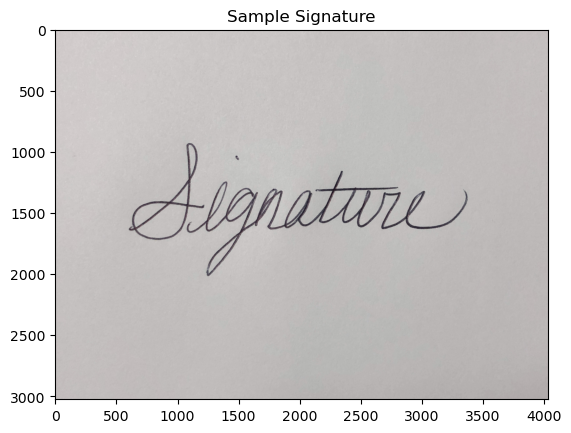

In [52]:
plt.imshow(sig_org[:, :, ::-1])
plt.title('Sample Signature');

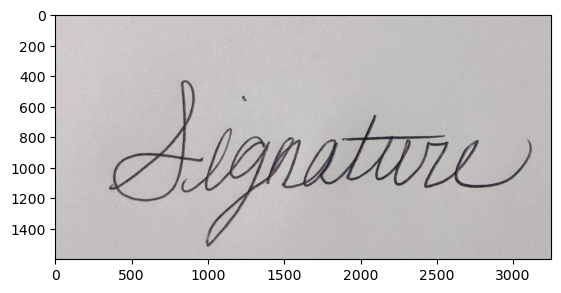

In [56]:
sig = sig_org[500:2100, 250:3500]
plt.imshow(sig[:,:,::-1]);

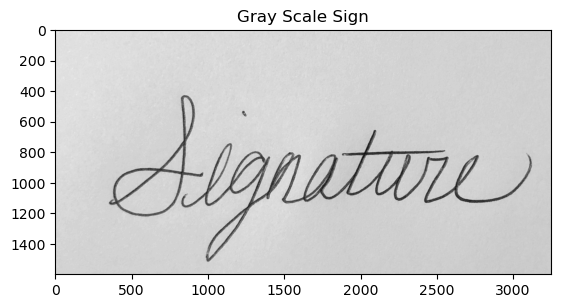

In [58]:
sig_gray = cv2.cvtColor(sig, cv2.COLOR_BGR2GRAY)
plt.imshow(sig_gray)
plt.title('Gray Scale Sign');

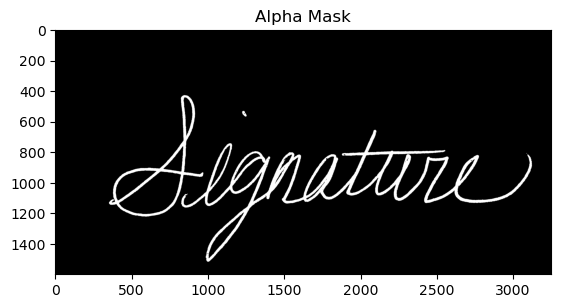

In [65]:
ret, alpha_mask = cv2.threshold(sig_gray, 150, 225, None)
alpha_mask = cv2.bitwise_not(alpha_mask)
plt.imshow(alpha_mask)
plt.title('Alpha Mask');

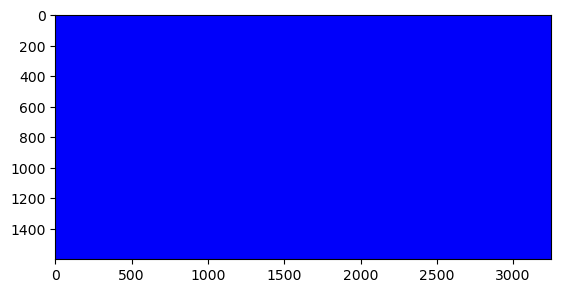

In [78]:
blue_mask = sig.copy()
blue_mask[:, :] = (250, 0, 0)
plt.imshow(blue_mask[:, :, ::-1]);

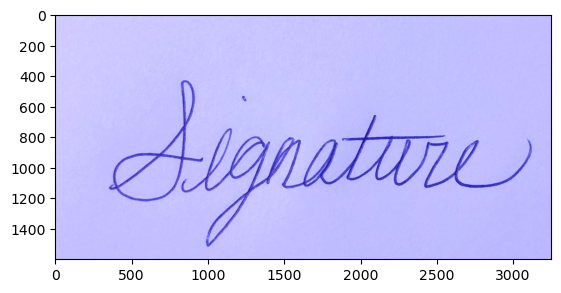

In [80]:
sig_color = cv2.addWeighted(sig, 1, blue_mask, 0.5, 0)
plt.imshow(sig_color[:, :, ::-1]);

In [81]:
b, g, r = cv2.split(sig_color)
print(b.shape)
print(g.shape)
print(r.shape)

(1600, 3250)
(1600, 3250)
(1600, 3250)


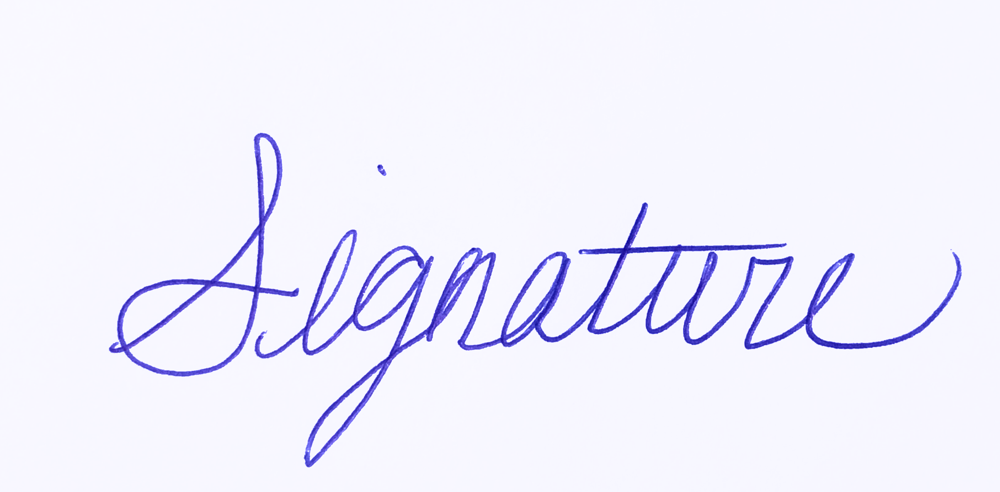

In [82]:
new = [b, g, r, alpha_mask]
png = cv2.merge(new, 4)
cv2.imwrite('extracted_sig.png', png)
Image('extracted_sig.png', width = '400')